In [1]:
import os
print(os.listdir("../input"))

['list_bbox_celeba.csv', 'list_eval_partition.csv', 'list_landmarks_align_celeba.csv', 'list_attr_celeba.csv', 'img_align_celeba']


In [2]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
#%matplotlib inline
# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [3]:
dataroot = '../input/img_align_celeba'

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

cuda:0


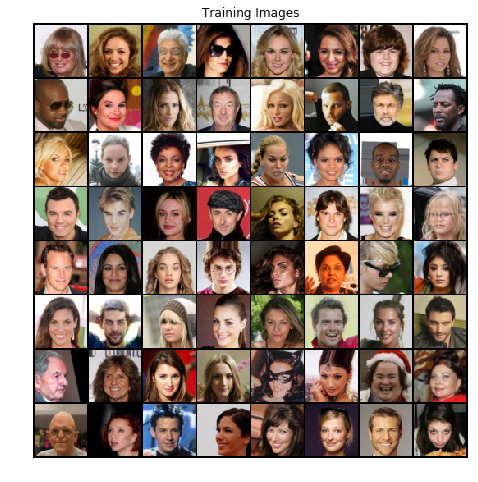

In [4]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [5]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv')!=-1:
        nn.init.normal_(m.weight.data,0.0,0.02)
    elif classname.find('BatchNorm')!=-1:
        nn.init.normal_(m.weight.data,1.0,0.02)
        nn.init.constant_(m.bias.data, 0)

In [6]:
class Generator(nn.Module):
    def __init__(self,ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Z=(nz,1,1)
            nn.ConvTranspose2d(nz,ngf*8,4,1,0,bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state_size(ngf*8,4,4)
            nn.ConvTranspose2d(ngf*8,ngf*4,4,2,1,bias=False),
            nn.BatchNorm2d(ngf*4),
             nn.ReLU(True),
            # state_size(ngf*4,8,8)
            nn.ConvTranspose2d(ngf*4,ngf*2,4,2,1,bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # state_size(ngf*2,16,16)
            nn.ConvTranspose2d(ngf*2,ngf,4,2,1,bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state_size(ngf,32,32)
            nn.ConvTranspose2d(ngf,nc,4,2,1,bias=False),
            nn.Tanh()
            # state_size(nc,64,64)
        )
    def forward(self,input):
        return self.main(input)

In [7]:
netG = Generator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
class Discriminator(nn.Module):
    def __init__(self,ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main=nn.Sequential(
            nn.Conv2d(nc,ndf,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),
            
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf*8,1,4,1,0,bias=False),
            nn.Sigmoid()
        )
    def forward(self, input):
        return self.main(input)
        

In [9]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64,nz,1,1,device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [11]:
img_list = []
G_losses=[]
D_losses=[]
iters=0
print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        #######################
        # Updata D: log(D(x))+log(1-D(G(x)))
        #######################
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output,label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        #######################
        # Updata G: log(D(G(x)))
        #######################
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output,label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        if i%50==0:
            print('[{}/{}][{}/{}]\tLoss_D: {}\tLoss_G: {}\tD(x): {}\tD(G(z)): {} / {}'
                  .format (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        if (i%500==0) or ((epoch==num_epochs-1) and (i==len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake,padding=2,normalize=True))
        i+=1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.7410460710525513	Loss_G: 4.776457786560059	D(x): 0.534267246723175	D(G(z)): 0.5771002769470215 / 0.013552126474678516
[0/5][50/1583]	Loss_D: 0.009291988797485828	Loss_G: 18.739973068237305	D(x): 0.9920018315315247	D(G(z)): 2.185313405789202e-07 / 2.6749103199108504e-07
[0/5][100/1583]	Loss_D: 0.08260257542133331	Loss_G: 5.3128509521484375	D(x): 0.9672486186027527	D(G(z)): 0.03447318822145462 / 0.011819969862699509
[0/5][150/1583]	Loss_D: 0.5206518769264221	Loss_G: 4.355044841766357	D(x): 0.7463326454162598	D(G(z)): 0.08167645335197449 / 0.029799919575452805
[0/5][200/1583]	Loss_D: 0.5890038013458252	Loss_G: 5.247532367706299	D(x): 0.7970914840698242	D(G(z)): 0.20945017039775848 / 0.008691912516951561
[0/5][250/1583]	Loss_D: 0.2874963879585266	Loss_G: 6.446389198303223	D(x): 0.85370272397995	D(G(z)): 0.047108788043260574 / 0.003469082759693265
[0/5][300/1583]	Loss_D: 0.6197606921195984	Loss_G: 5.767376899719238	D(x): 0.8972002863883972	D

[1/5][1250/1583]	Loss_D: 0.5237826108932495	Loss_G: 3.7829320430755615	D(x): 0.8400263786315918	D(G(z)): 0.2526836395263672 / 0.03701377660036087
[1/5][1300/1583]	Loss_D: 0.48747050762176514	Loss_G: 3.586521863937378	D(x): 0.902249813079834	D(G(z)): 0.282096803188324 / 0.042306944727897644
[1/5][1350/1583]	Loss_D: 0.8434553146362305	Loss_G: 5.076559066772461	D(x): 0.9307657480239868	D(G(z)): 0.4762434959411621 / 0.013315504416823387
[1/5][1400/1583]	Loss_D: 0.47163891792297363	Loss_G: 4.467264175415039	D(x): 0.9188008308410645	D(G(z)): 0.2906777262687683 / 0.017563756555318832
[1/5][1450/1583]	Loss_D: 0.7258607745170593	Loss_G: 2.653770923614502	D(x): 0.7016676664352417	D(G(z)): 0.24381989240646362 / 0.0936860516667366
[1/5][1500/1583]	Loss_D: 0.6329310536384583	Loss_G: 3.045614719390869	D(x): 0.9436922073364258	D(G(z)): 0.3922032415866852 / 0.07439621537923813
[1/5][1550/1583]	Loss_D: 0.4645179212093353	Loss_G: 2.736111640930176	D(x): 0.8637232780456543	D(G(z)): 0.24974358081817627 / 

[3/5][900/1583]	Loss_D: 0.9169451594352722	Loss_G: 2.3307464122772217	D(x): 0.6803910732269287	D(G(z)): 0.35041123628616333 / 0.12064703553915024
[3/5][950/1583]	Loss_D: 0.6718565821647644	Loss_G: 3.1453354358673096	D(x): 0.895784318447113	D(G(z)): 0.3825838565826416 / 0.05953138321638107
[3/5][1000/1583]	Loss_D: 0.5729931592941284	Loss_G: 2.4278464317321777	D(x): 0.7743117809295654	D(G(z)): 0.23826926946640015 / 0.10645867884159088
[3/5][1050/1583]	Loss_D: 1.091006875038147	Loss_G: 1.513102650642395	D(x): 0.44885414838790894	D(G(z)): 0.13167034089565277 / 0.26810210943222046
[3/5][1100/1583]	Loss_D: 0.8691567182540894	Loss_G: 1.6641813516616821	D(x): 0.5232471227645874	D(G(z)): 0.09766721725463867 / 0.231035977602005
[3/5][1150/1583]	Loss_D: 0.6222348213195801	Loss_G: 2.0045645236968994	D(x): 0.7089372277259827	D(G(z)): 0.20008182525634766 / 0.1729445457458496
[3/5][1200/1583]	Loss_D: 0.47005748748779297	Loss_G: 2.3224215507507324	D(x): 0.7746591567993164	D(G(z)): 0.16501544415950775 

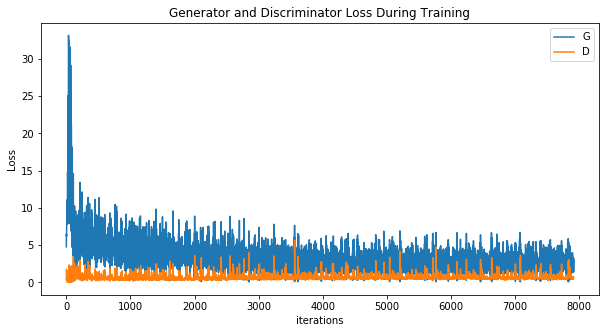

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

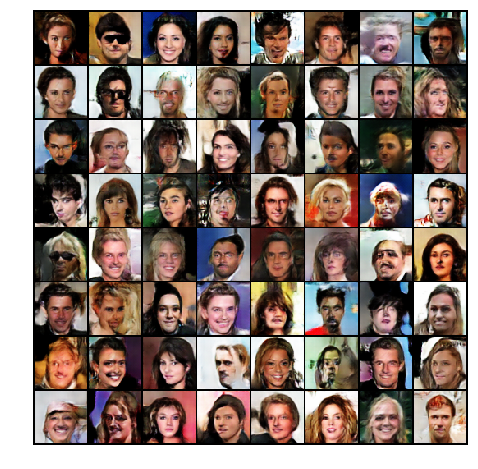

In [14]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()